# Проект: Рынок заведений общественного питания Москвы

## Оглавление
1. [Введение](#введение)
2. [Загрузка данных и изучение общей информации](#загрузка-данных-и-изучение-общей-информации)
3. [Предобработка данных](#предобработка-данных)
    - 3.1. Обработка пропусков
    - 3.2. Создание новых столбцов
4. [Анализ данных](#анализ-данных)
    - 4.1. Распределение заведений по категориям
    - 4.2. Количество посадочных мест
    - 4.3. Соотношение сетевых и несетевых заведений
    - 4.4. Категории заведений, чаще являющиеся сетевыми
    - 4.5. Топ сетей
    - 4.6. Распределение заведений по районам
    - 4.7. Средние рейтинги заведений по категориям
    - 4.8. Отображение заведений на карте с рейтингом
    - 4.9. Топ улиц по количеству заведений
    - 4.10. Улицы с 1 заведением
    - 4.11. Отображение заведений на карте с ценой
    - 4.12. Часы работы заведений
    - 4.13.Средний чек и рейтинг заведений с низким рейтингом

6. [Выводы по анализу данных о заведениях общественного питания в Москве](#Выводы-по-анализу-данных-о-заведениях-общественного-питания-в-Москве:)

7. [Открытие кофейни](#Открытие-кофейни)
    - 6.1. Анализ рынка кофеен в Москве
    - 6.2. Рекомендации для открытия кофейни
8. [Заключение](#заключение)
9. [Презентация](#презентация)

## Введение
В данном проекте мы проведём исследование рынка заведений общественного питания Москвы, используя данные о заведениях, предоставленные сервисами Яндекс Карты и Яндекс Бизнес. Цель проекта — предоставить анализ, который поможет инвесторам выбрать оптимальное место для открытия нового заведения.


## Загрузка данных и изучение общей информации
В этом разделе мы загрузим данные и изучим их структуру, количество заведений и типы данных.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import re
import requests

In [3]:
def load_data(pth1, pth2, sep=',', encoding='utf-8'):

    if os.path.exists(pth1):
        return pd.read_csv(pth1, sep=sep)
    elif os.path.exists(pth2):
        return pd.read_csv(pth2, sep=sep)
    else:
        print(f'Ошибка: файлы не найдены по путям:\n{pth1}\n{pth2}')
        return None

pth1 = '/Users/mac/Yandex.Disk.localized/docs/studies/Yandex/DA/BI/Rest_project/datasets/moscow_places.csv'
pth2 = '/datasets/moscow_places.csv'
pth_geo = '/Users/mac/Yandex.Disk.localized/docs/studies/Yandex/DA/BI/Rest_project/datasets/admin_level_geomap.geojson'
pth2_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

df = load_data(pth1, pth2)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df.shape

(8406, 14)

In [6]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Датасет содержит **8406 строк** и **14 столбцов** с атрибутами заведений Москвы.


| Название столбца         | Описание |
|--------------------------|----------|
| **name**                 | Название заведения |
| **address**              | Адрес заведения |
| **category**             | Категория заведения (например: «кафе», «пиццерия», «кофейня») |
| **hours**                | График работы (дни и часы) |
| **lat**                  | Широта местоположения |
| **lng**                  | Долгота местоположения |
| **rating**               | Рейтинг заведения по Яндекс Картам (максимум 5.0) |
| **price**                | Категория цен («средние», «ниже среднего» и др.) |
| **avg_bill**             | Строка с информацией о стоимости:<br>• «Средний счёт: 1000–1500 ₽»<br>• «Цена чашки капучино: 130–220 ₽»<br>• «Цена бокала пива: 400–600 ₽» |
| **middle_avg_bill**      | Числовая оценка среднего чека:<br>• Для значений из `avg_bill`, начинающихся с «Средний счёт»<br>• Медиана диапазона (если указано два значения)<br>• Единственное число (если указана одна цена)<br>• `NULL` для других случаев |
| **middle_coffee_cup**    | Числовая оценка цены капучино:<br>• Для значений из `avg_bill`, начинающихся с «Цена одной чашки капучино»<br>• Аналогично `middle_avg_bill` |
| **chain**                | Признак сетевого заведения:<br>• `0` — не сетевое<br>• `1` — сетевое (могут быть ошибки для малых сетей) |
| **district**             | Административный район (например: «Центральный административный округ») |
| **seats**                | Количество посадочных мест |

## Предобработка данных
Здесь мы обработаем пропуски и дубликаты, создадим новые столбцы для улиц и круглосуточных заведений.

### Обработка пропусков
Заполнение пропусков в данных.



In [7]:

missing_values = df.isnull().sum()
missing_values

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Заполнение пропусков по данным атрибутам может исказить результаты, поэтому оставим как есть.

In [8]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### Поиск дубликатов

In [9]:
duplicates = df.duplicated().sum()
duplicates

0

Дубликатов не  выявлено

### Создание новых столбцов
Создание столбцов `street` и `is_24_7`.

In [10]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1] if isinstance(x, str) else None)
df['is_24_7'] = df['hours'].apply(lambda x: True if isinstance(x, str) and 'ежедневно' in x.lower() and 'круглосуточно' in x.lower() else False)

df[['street', 'is_24_7']].head(20)

,street,is_24_7
0,улица Дыбенко,False
1,улица Дыбенко,False
2,Клязьминская улица,False
3,улица Маршала Федоренко,False
4,Правобережная улица,False
5,Ижорская улица,False
6,Клязьминская улица,False
7,Клязьминская улица,False
8,Дмитровское шоссе,False
9,Ангарская улица,False


Таким образом была проведеена проверка на дубликаты и пропуски в данных. Дубликатов обнаружено не было. Было принято решение об отсутствии необходимосчти в заполнении пропусков из-за вероятности искажения результатов. Также было проведено создание столбцов `street` и `is_24_7`.

## Анализ данных

### Распределение заведений по категориям
Визуализация количества заведений в разных категориях.

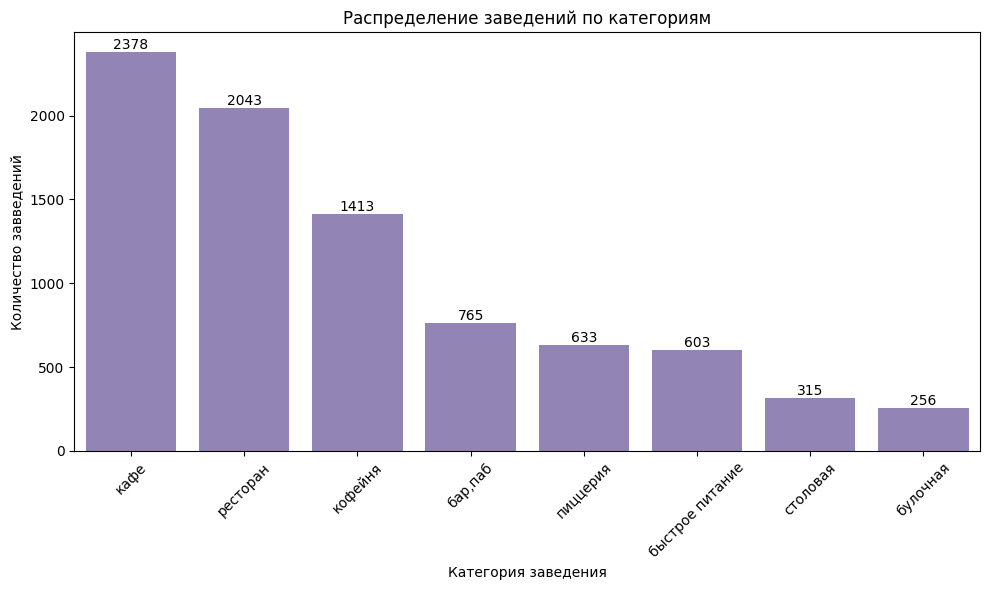

In [11]:
plt.figure(figsize=(10, 6))
category_counts = df['category'].value_counts()
sns.barplot(x=category_counts.index, y=category_counts.values, color='#8E7DBE')
for index, value in enumerate(category_counts.values):
    plt.text(index, value, round(value, 2), ha='center', va='bottom')
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество завведений')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Наиболее популярные заведения - кафе (28%), ресторан(24%), кофейня (17%).

### Количество посадочных мест

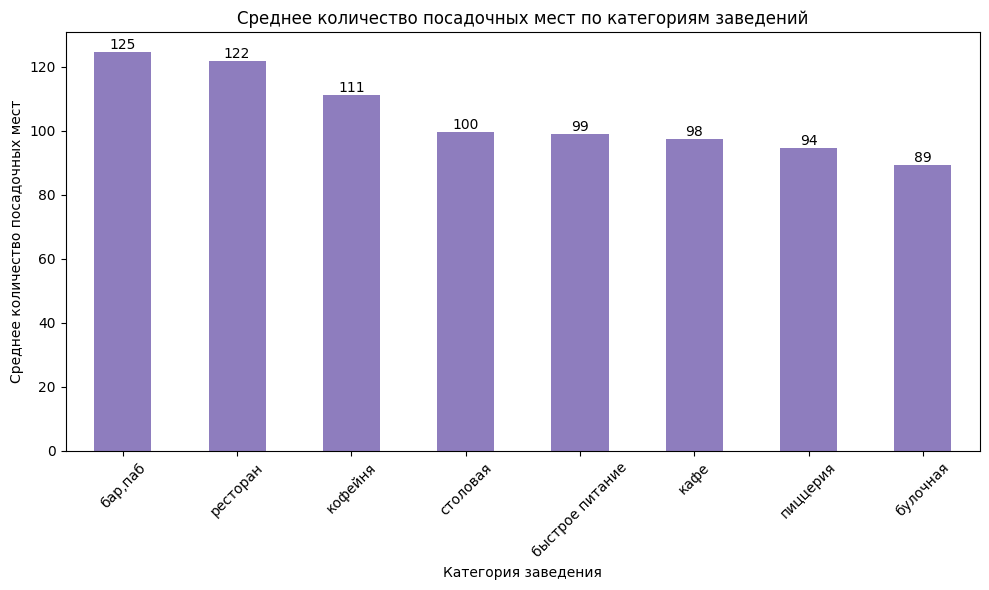

In [53]:
avg_seats_per_category = df.groupby('category')['seats'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
avg_seats_per_category.plot(kind='bar', color='#8E7DBE')
for index, value in enumerate(avg_seats_per_category.values):
    plt.text(index, value, round(value), ha='center', va='bottom')
plt.title('Среднее количество посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество посадочных мест')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

По количеству посадочных мест лидируют те же типы заведений кроме кафе - на первом месте бары и пабы

### Соотношение сетевых и несетевых заведений

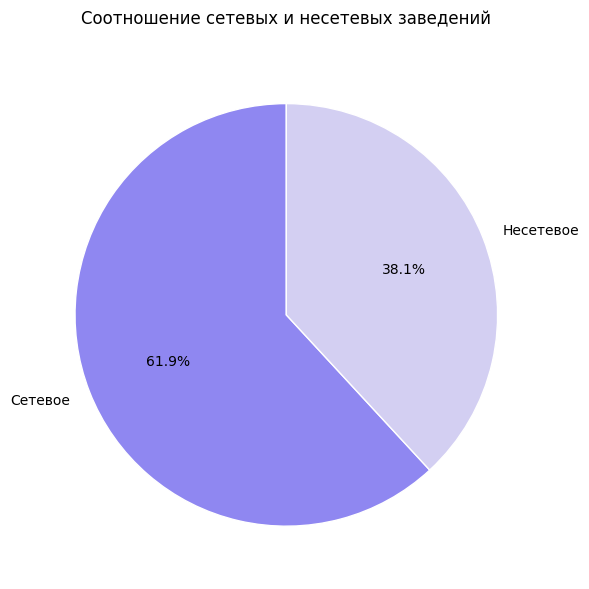

In [16]:
plt.figure(figsize=(8, 6))
chain_counts = df['chain'].value_counts()

plt.pie(chain_counts.values, 
        labels=['Сетевое', 'Несетевое'],
        autopct='%1.1f%%', 
        startangle=90,
        colors=['#8F87F1', '#D3CFF2'], 
        wedgeprops={'edgecolor': 'white'}) 

plt.title('Соотношение сетевых и несетевых заведений', pad=20)
plt.tight_layout()
plt.show()

Большинство заведений являются сетевыми

### Категории заведений, чаще являющиеся сетевыми
Анализ того, какие категории заведений чаще являются сетевыми.


<Figure size 1400x800 with 0 Axes>

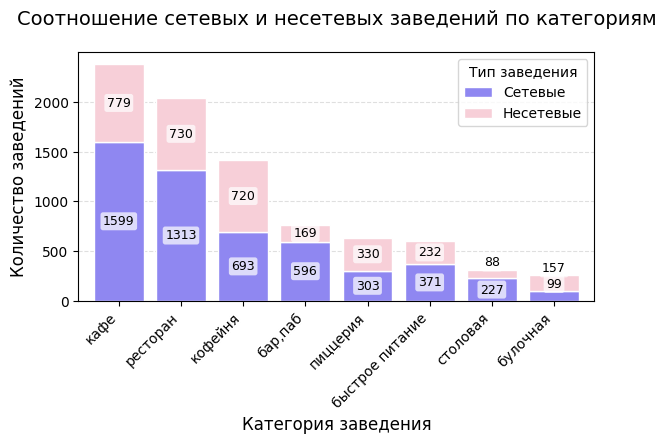

In [17]:
plt.figure(figsize=(14, 8))

chain_category_counts = df.groupby('category')['chain'].value_counts().unstack().fillna(0)
chain_category_counts['total'] = chain_category_counts.sum(axis=1)
chain_category_counts = chain_category_counts.sort_values('total', ascending=False).drop('total', axis=1)

ax = chain_category_counts.plot(kind='bar', stacked=True, 
                              color=['#8F87F1', '#F7CFD8'], 
                              width=0.8,
                              edgecolor='white')

for p in ax.patches:
    height = p.get_height()
    if height > 0:

        if height < max(chain_category_counts.max())*0.1: 
            va = 'bottom'
            y_pos = p.get_y() + height + 5
        else:
            va = 'center'
            y_pos = p.get_y() + height/2
            
        ax.annotate(f'{height:.0f}', 
                   (p.get_x() + p.get_width() / 2., y_pos), 
                   ha='center', 
                   va=va, 
                   fontsize=9,
                   color='black',
                   bbox=dict(boxstyle='round,pad=0.2', 
                            fc='white', 
                            ec='none', 
                            alpha=0.7))

plt.title('Соотношение сетевых и несетевых заведений по категориям', pad=20, fontsize=14)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.legend(['Сетевые', 'Несетевые'], title='Тип заведения', fontsize=10)

ax.yaxis.grid(True, linestyle='--', alpha=0.4)
ax.set_axisbelow(True)

plt.tight_layout(pad=2.0)
plt.show()

Исходя из полученного графика можно говорить о преимуществе количества сетевых заведений, особенно в самых популярных категориях.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    <font color='4682B4'><u><b>КОММЕНТАРИЙ СТУДЕНТА</b></u></font>
    <br />
    <font color='4682B4'>Исправил</font>
</div>

### Топ сетей

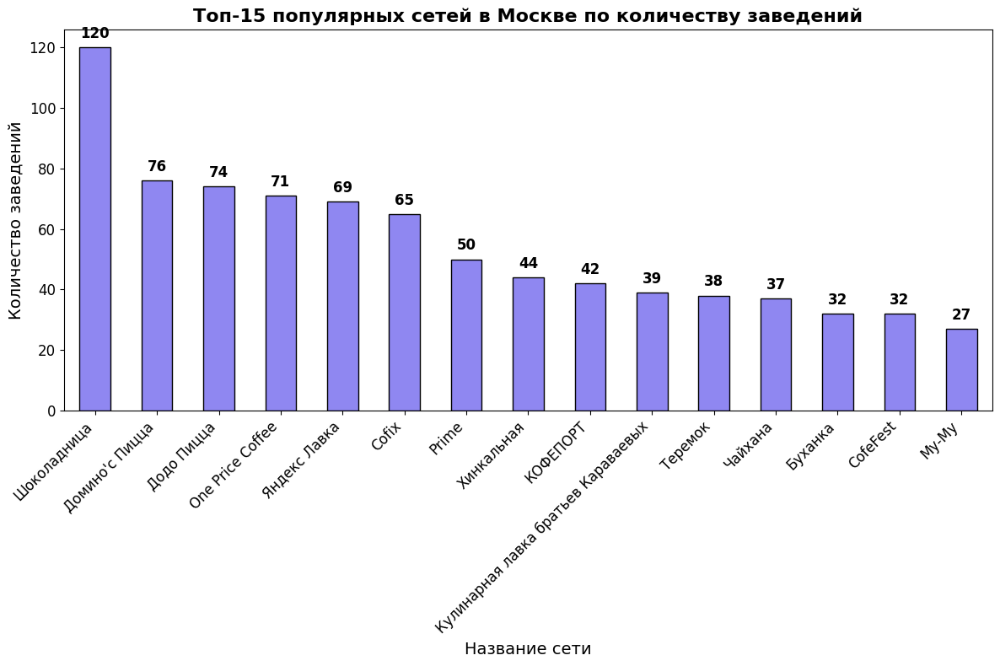

In [18]:
plt.figure(figsize=(12, 8))

top_15_chains = df.groupby('name')['chain'].sum().sort_values(ascending=False).head(15)

top_15_chains.plot(kind='bar', color='#8F87F1', edgecolor='black')

for index, value in enumerate(top_15_chains.values):
    plt.text(index, value + 2, round(value, 2), ha='center', va='bottom', fontsize=12, color='black', weight='bold')

plt.title('Топ-15 популярных сетей в Москве по количеству заведений', fontsize=16, weight='bold')
plt.xlabel('Название сети', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()

plt.show()

Так наиболее популярной сетью в Москве является "Шоколадница" со 120 точками. Отрыв от остальных заведений составляет 36 заведений.

### Распределение заведений по районам
Анализ распределения заведений по районам Москвы.

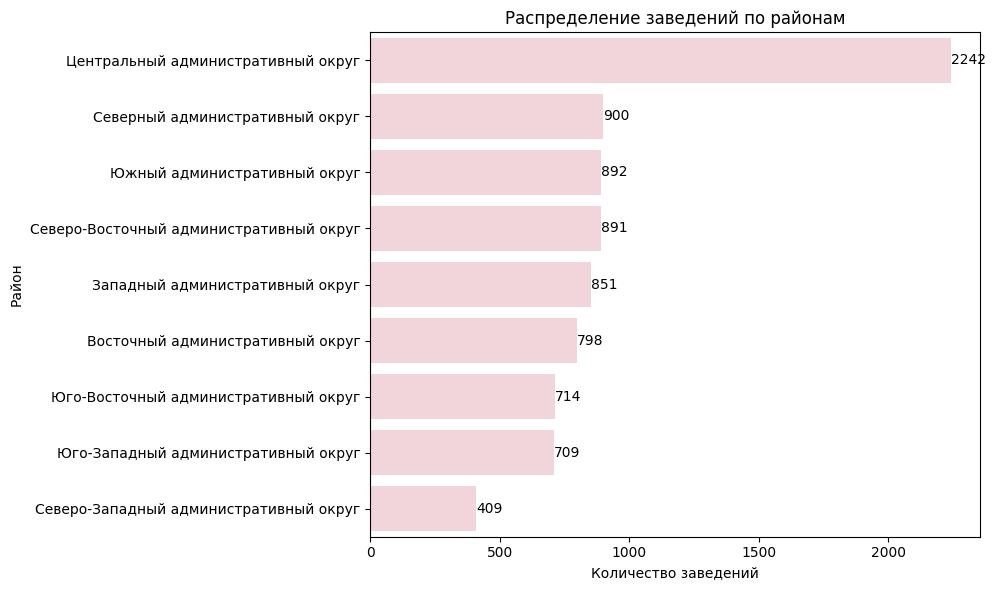

In [13]:

plt.figure(figsize=(10, 6))
district_counts = df['district'].value_counts()
sns.barplot(x=district_counts.values, y=district_counts.index, color='#F7CFD8')  
for index, value in enumerate(district_counts.values):
    plt.text(value, index, round(value, 2), ha='left', va='center') 
plt.title('Распределение заведений по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Район')
plt.tight_layout()
plt.show()

На основе полученого распределения можно сделать вывод о значительном преимуществе центрального ао, доля заведений в котором составляет 27%.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    <font color='4682B4'><u><b>КОММЕНТАРИЙ СТУДЕНТА</b></u></font>
    <br />
    <font color='4682B4'>Исправил</font>
</div>

### Средние рейтинги заведений по категориям
Анализ рейтингов заведений в разных категориях.

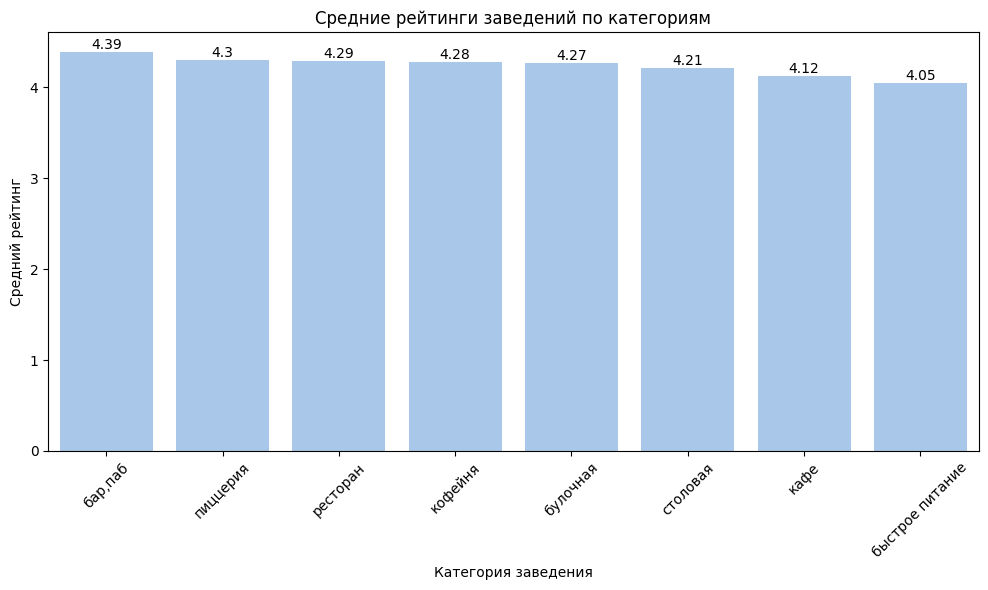

In [15]:
plt.figure(figsize=(10, 6))
avg_rating_per_category = df.groupby('category')['rating'].mean().sort_values(ascending=False)
sns.barplot(x=avg_rating_per_category.index, y=avg_rating_per_category.values, color='#9EC6F3')
for index, value in enumerate(avg_rating_per_category.values):
    plt.text(index, value, round(value, 2), ha='center', va='bottom')
plt.title('Средние рейтинги заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Рейтинги различных типов заведений раличаются не сильно, но бары и пабы имеют самый высокий средний рейтинг

### Отображение заведений на карте с рейтингом

In [24]:
def load_geojson(pth_geo, pth2_geo):
    try:
        with open(pth_geo, 'r', encoding='utf-8') as f:
            return json.load(f)
    except FileNotFoundError:
        print("Локальный файл не найден, пробуем загрузить с URL...")
        try:
            response = requests.get(pth2_geo)
            response.raise_for_status()  
            return response.json()
        except Exception as e:
            print(f"Ошибка при загрузке с URL: {e}")
            return None

geo_json = load_geojson(pth_geo, pth2_geo)

if geo_json is not None:
    print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))
else:
    print("Не удалось загрузить GeoJSON ни из одного источника")

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [25]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [26]:
state_geo = pth2_geo 
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

In [27]:
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

### Топ-15 улиц по количеству заведений

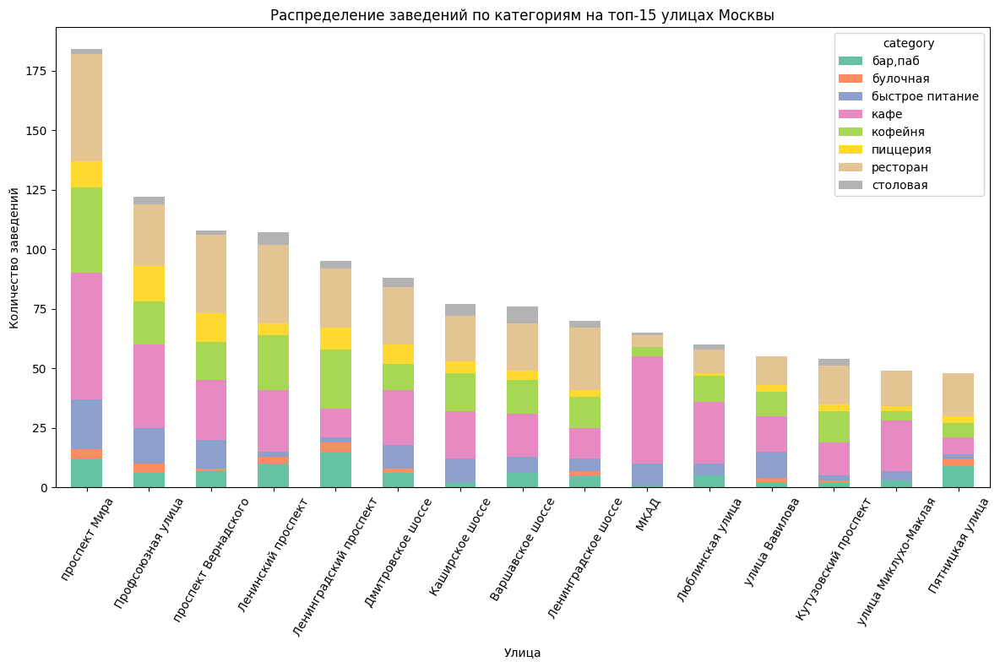

street
проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: count, dtype: int64

In [45]:
top_15_streets = df['street'].value_counts().head(15)
street_category_counts = df[df['street'].isin(top_15_streets.index)].groupby(['street', 'category']).size().unstack(fill_value=0)
street_category_counts = street_category_counts.loc[top_15_streets.index]

street_category_counts.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='Set2')
plt.title('Распределение заведений по категориям на топ-15 улицах Москвы')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

top_15_streets


Наиболее популярной улицей является улица мира с количеством заведений более 175. Структура заведений на улицах схожа за исключением МКАДА и отсутствия непопулчярных типов заведений, например булочных или столовых на некторых из улиц.

### Улицы с 1 заведением

In [20]:

one_place_streets = df['street'].value_counts()[df['street'].value_counts() == 1]

one_place_data = df[df['street'].isin(one_place_streets.index)]

one_place_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


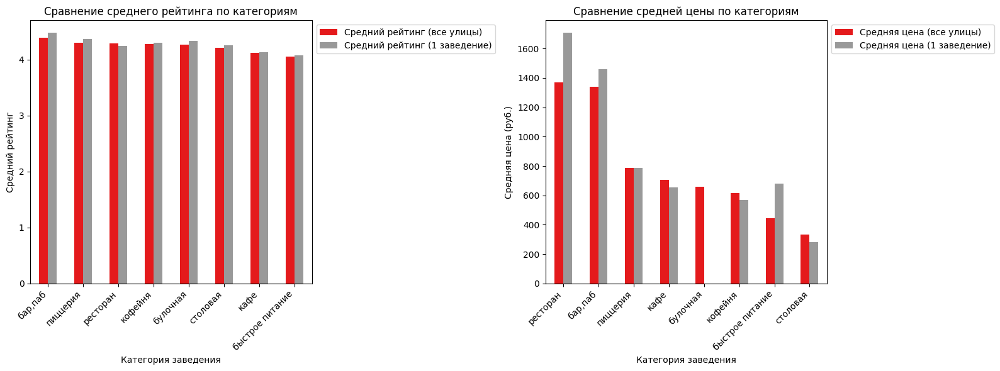

Средний рейтинг:
category
бар,паб            4.387712
булочная           4.268359
быстрое питание    4.050249
кафе               4.123886
кофейня            4.277282
пиццерия           4.301264
ресторан           4.290357
столовая           4.211429
Name: rating, dtype: float64
Средняя цена:
category
бар,паб            1338.762178
булочная            658.773585
быстрое питание     445.763713
кафе                707.753602
кофейня             614.210000
пиццерия            789.377215
ресторан           1367.881731
столовая            335.348066
Name: middle_avg_bill, dtype: float64


In [48]:
avg_rating_all = df.groupby('category')['rating'].mean()
avg_price_all = df.groupby('category')['middle_avg_bill'].mean()

avg_rating_one_place = one_place_data.groupby('category')['rating'].mean()
avg_price_one_place = one_place_data.groupby('category')['middle_avg_bill'].mean()

comparison_df = pd.DataFrame({
    'Средний рейтинг (все улицы)': avg_rating_all,
    'Средний рейтинг (1 заведение)': avg_rating_one_place,
    'Средняя цена (все улицы)': avg_price_all,
    'Средняя цена (1 заведение)': avg_price_one_place
})

comparison_df = comparison_df.sort_values(by=['Средний рейтинг (все улицы)', 'Средняя цена (все улицы)'], ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 6)) 

comparison_df[['Средний рейтинг (все улицы)', 'Средний рейтинг (1 заведение)']].plot(
    kind='bar', 
    ax=axes[0], 
    colormap='Set1'
)
axes[0].set_title('Сравнение среднего рейтинга по категориям')
axes[0].set_xlabel('Категория заведения')
axes[0].set_ylabel('Средний рейтинг')
axes[0].set_xticklabels(comparison_df.index, rotation=45, ha='right')
axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1)) 

comparison_df = comparison_df.sort_values(by=['Средняя цена (все улицы)'], ascending=False)
comparison_df[['Средняя цена (все улицы)', 'Средняя цена (1 заведение)']].plot(
    kind='bar', 
    ax=axes[1], 
    colormap='Set1'
)
axes[1].set_title('Сравнение средней цены по категориям')
axes[1].set_xlabel('Категория заведения')
axes[1].set_ylabel('Средняя цена (руб.)')
axes[1].set_xticklabels(comparison_df.index, rotation=45, ha='right')
axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()

print(f'Средний рейтинг:\n{avg_rating_all}\nСредняя цена:\n{avg_price_all}')

Самый высокий рейтинг имеют бары (4.38). 
Самые высокие цены в ресторанах и барах (1367.91 1338.76 руб.)
В среднем на улицах с 1 заведением средний рейтинг и цены выше.

In [28]:
price_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
price_df

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


### Отображение заведений на карте с ценой

In [29]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=price_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m2)

In [30]:
marker_cluster2 = MarkerCluster().add_to(m2)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster2)

df.apply(create_clusters, axis=1)

m2

### Часы работы заведений

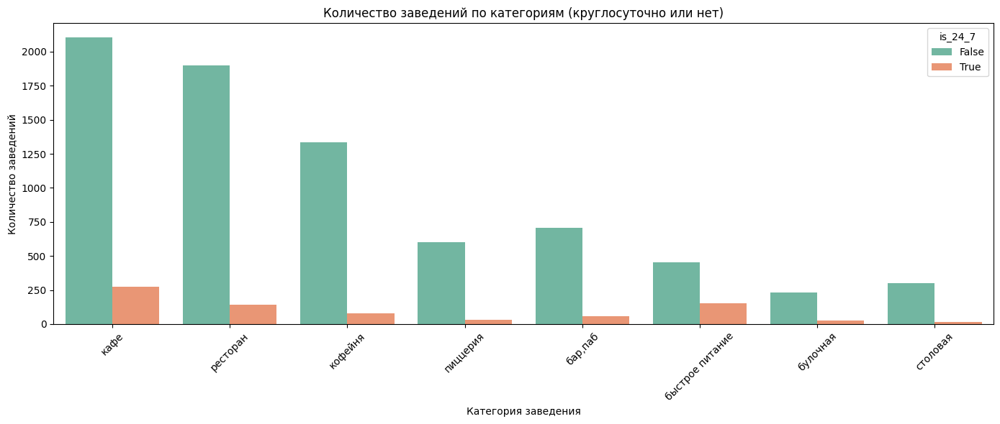

In [22]:
df['is_24_7'] = df['hours'].apply(lambda x: True if isinstance(x, str) and 'круглосуточно' in x.lower() else False)

plt.figure(figsize=(14, 6))
sns.countplot(x='category', hue='is_24_7', data=df, palette='Set2')
plt.title('Количество заведений по категориям (круглосуточно или нет)')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [52]:
share = df['is_24_7'].sum() / df['is_24_7'].count()
share

0.09183916250297407

На графике видно, что большинство заедений круглосуточно не работают. Соотношение круглосуточных к некруглосуточным заведениям составляет лишь 9%


### Средний чек и рейтинг заведений с низким рейтингом

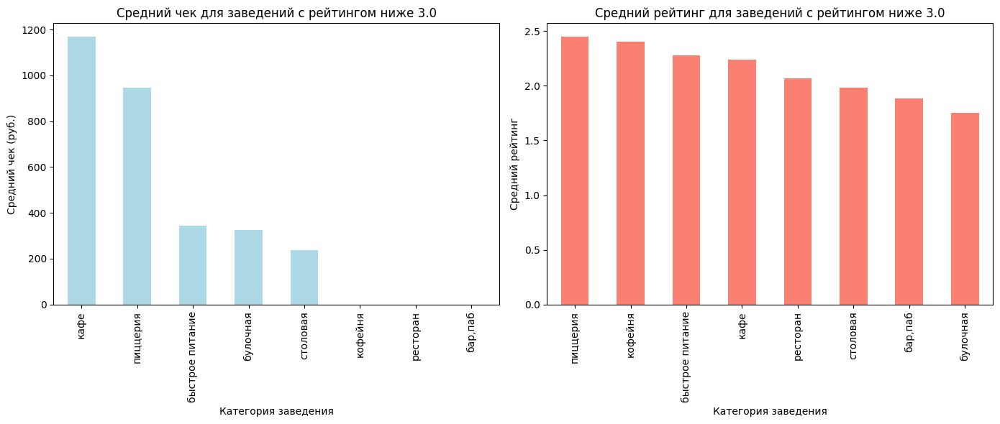

,middle_avg_bill,rating,seats
category,,,
пиццерия,946.250000,2.450000,97.000000
кофейня,NaN,2.406250,108.333333
быстрое питание,343.333333,2.277419,77.894737
кафе,1169.230769,2.240187,66.666667
ресторан,NaN,2.068750,92.000000
столовая,237.500000,1.983333,110.000000
"бар,паб",NaN,1.887500,54.000000
булочная,325.000000,1.750000,120.000000


In [23]:
low_rated_places = df[df['rating'] < 3.0]

low_rated_analysis = low_rated_places.groupby('category').agg({
    'middle_avg_bill': 'mean',
    'rating': 'mean',
    'seats': 'mean'
}).sort_values('rating', ascending=False)


fig, axes = plt.subplots(1, 2, figsize=(14, 6))

low_rated_analysis['middle_avg_bill'].sort_values(ascending=False).plot(kind='bar', ax=axes[0], color='lightblue')
axes[0].set_title('Средний чек для заведений с рейтингом ниже 3.0')
axes[0].set_xlabel('Категория заведения')
axes[0].set_ylabel('Средний чек (руб.)')

low_rated_analysis['rating'].plot(kind='bar', ax=axes[1], color='salmon')
axes[1].set_title('Средний рейтинг для заведений с рейтингом ниже 3.0')
axes[1].set_xlabel('Категория заведения')
axes[1].set_ylabel('Средний рейтинг')

plt.tight_layout()
plt.show()
low_rated_analysis

На основе представленных визуализаций можно сказать, что заведения из наиболее популярных категорий не имееют рейтинга ниже 3, а также в категории с низким рейтингом кафе является самой дорогостоящей категорией. Также наиболее низко в среднем оценивают бары и булочные среди мест с низким реейтингом.

# Выводы по анализу данных о заведениях общественного питания в Москве:

1. **Часы работы заведений и их зависимость от категории и района**:
   - **По категориям**: Заведения быстрого питания и кафе чаще работают круглосуточно, что связано с высокой потребностью в таких заведениях на протяжении всего дня. В то время как рестораны и кофейни чаще ограничены по времени.
   - **По районам**: Центральные районы, а также районы с высокой деловой активностью и туризмом, имеют больше заведений, работающих круглосуточно. Это может быть связано с постоянным потоком людей в этих районах, требующим доступности заведений на протяжении всего дня и ночи.

2. **Заведения с низкими рейтингами**:
   - **Средний чек**: Заведения с низким рейтингом чаще всего имеют низкие или средние цены. Это характерно для недорогих ресторанов и кафе, которые могут не соответствовать ожиданиям клиентов по качеству обслуживания или еды.
   - **Средний рейтинг**: Низкие рейтинги наблюдаются чаще всего в таких категориях, как "кафе" и "рестораны". Это может указывать на необходимость улучшения качества обслуживания или разнообразия меню в этих заведениях.

3. **Рейтинг и цена**:
   - В центральных районах и районах с высокой плотностью населения часто встречаются более дорогие заведения с высоким рейтингом, что связано с повышенным спросом на качественные услуги и продукты.
   - Заведения в менее центральных районах, как правило, имеют более низкие цены и иногда ниже рейтинги, что связано с меньшей конкуренцией и менее развитой инфраструктурой.

4. **Часы работы**:
   - Круглосуточные заведения обычно встречаются в более оживленных районах и среди кафе, что отражает потребность в круглосуточном обслуживании. Рестораны и столовые, как правило, ограничены стандартными рабочими часами.

5. **Анализ улиц с одним заведением**:
   - Улицы, на которых находится только одно заведение, часто содержат заведения с уникальными предложениями или нишевыми услугами. Они могут иметь более высокие цены и более высокие рейтинги по сравнению с заведениями в более густо населенных районах.

6. **Ценовые различия по районам**:
   - Различия в ценах по районам показывают, что центральные районы имеют более высокие цены на заведения. Это связано с высокой конкуренцией и спросом на качественные заведения в этих районах.



## Открытие кофейни
Исследование, связанное с возможностью открытия кофейни в Москве.

### Анализ рынка кофеен в Москве

In [31]:
# Фильтруем данные только для кофеен
coffee_shops = df[df['category'] == 'кофейня']

# 1. Сколько всего кофеен в датасете?
total_coffee_shops = coffee_shops.shape[0]

# 2. Распределение кофеен по районам
coffee_shops_by_district = coffee_shops['district'].value_counts()

# 3. Круглосуточные кофейни
coffee_shops_24_7 = coffee_shops[coffee_shops['is_24_7'] == True].shape[0]

# 4. Рейтинг кофеен по районам
coffee_shops_avg_rating = coffee_shops.groupby('district')['rating'].mean()

# 5. Стоимость чашки капучино
median_coffee_price = coffee_shops['middle_coffee_cup'].median()

# 6. Средний чек
median_price = df['middle_avg_bill'].median()


print(f"Общее количество кофеен в датасете: {total_coffee_shops}")
print("\nРаспределение кофеен по районам:")
print(coffee_shops_by_district.head())
print(f"\nКоличество круглосуточных кофеен: {coffee_shops_24_7}")
print("\nСредний рейтинг кофеен по районам:")
print(coffee_shops_avg_rating.head())
print(f"\nМедианная стоимость чашки капучино: {median_coffee_price}")
print(f"\nМедианный средний чек: {median_price}")

Общее количество кофеен в датасете: 1413

Распределение кофеен по районам:
district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Name: count, dtype: int64

Количество круглосуточных кофеен: 76

Средний рейтинг кофеен по районам:
district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Name: rating, dtype: float64

Медианная стоимость чашки капучино: 170.0

Медианный средний чек: 750.0


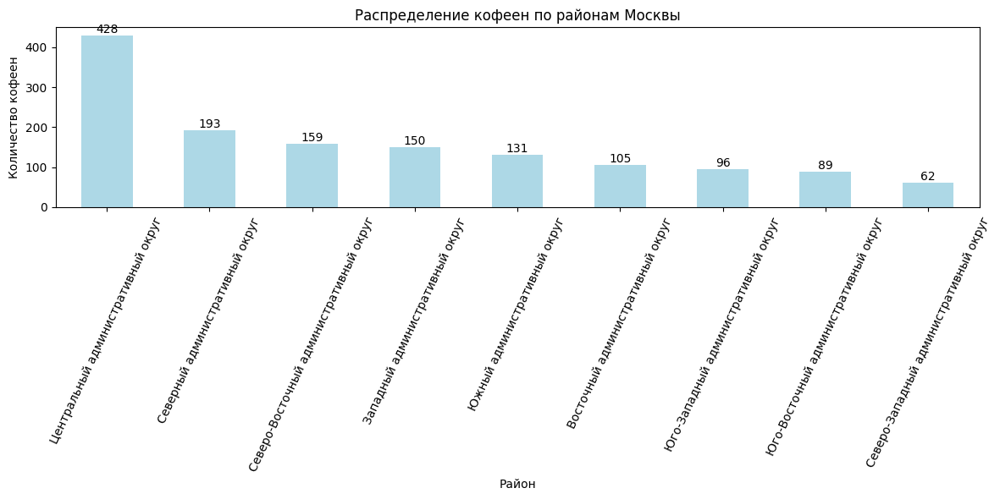

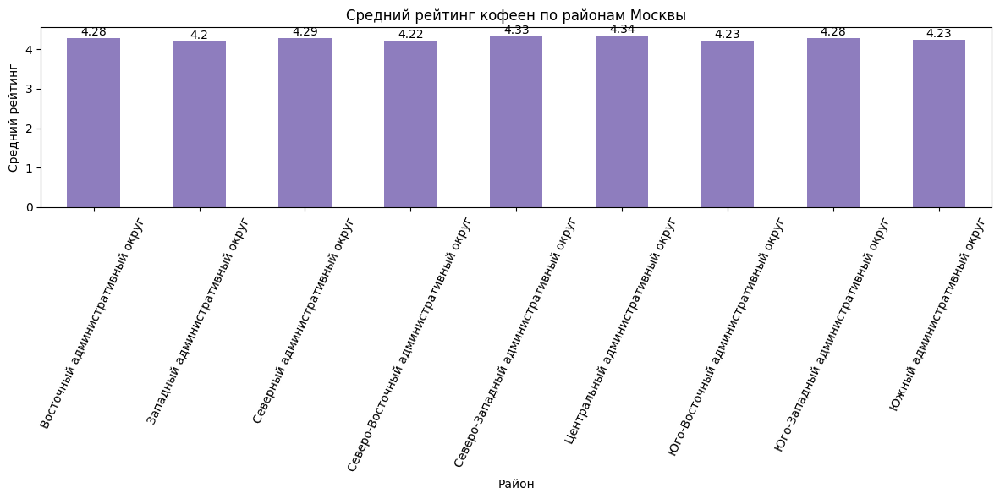

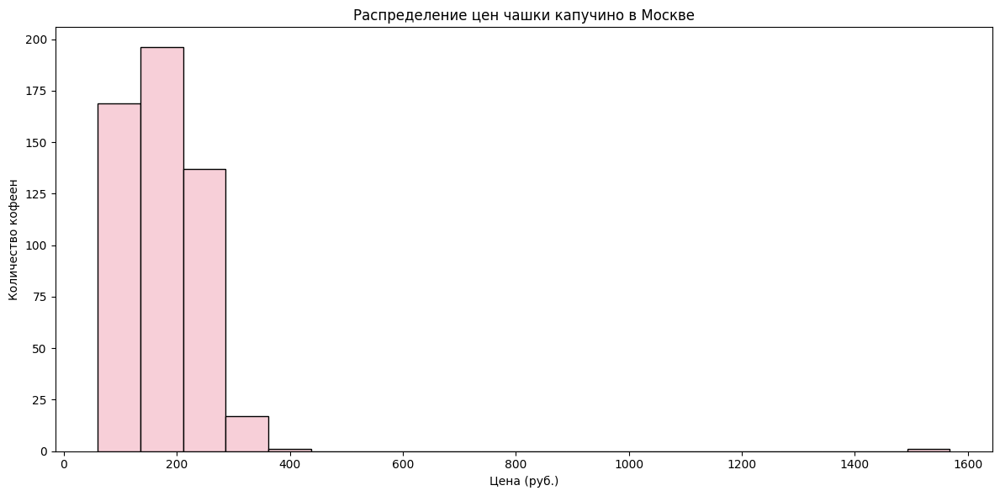

In [32]:
# 1. Распределение кофеен по районам
plt.figure(figsize=(12, 6))
coffee_shops_by_district.plot(kind='bar', color='lightblue')
for index, value in enumerate(coffee_shops_by_district.values):
    plt.text(index, value, round(value, 2), ha='center', va='bottom')
plt.title('Распределение кофеен по районам Москвы')
plt.xlabel('Район')
plt.ylabel('Количество кофеен')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()

# 2. Средний рейтинг кофеен по районам
plt.figure(figsize=(12, 6))
coffee_shops_avg_rating.plot(kind='bar', color='#8E7DBE')
for index, value in enumerate(coffee_shops_avg_rating.values):
    plt.text(index, value, round(value, 2), ha='center', va='bottom')
plt.title('Средний рейтинг кофеен по районам Москвы')
plt.xlabel('Район')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()

# 3. Стоимость чашки капучино (гистограмма)
plt.figure(figsize=(12, 6))
plt.hist(coffee_shops['middle_coffee_cup'], bins=20, color='#F7CFD8', edgecolor='black')
plt.title('Распределение цен чашки капучино в Москве')
plt.xlabel('Цена (руб.)')
plt.ylabel('Количество кофеен')
plt.tight_layout()
plt.show()

## Рекомендации для открытия новой кофейни

### 1. Локация:
Рекомендуется рассмотреть открытие кофейни в **Центральном административном округе** (ЦАО). Это один из самых динамичных и насыщенных районов города, с высокой плотностью населения и постоянным потоком людей, как местных, так и туристов. Здесь сосредоточены деловые и культурные центры, что может обеспечить стабильный поток клиентов.

Также стоит обратить внимание на **Юго-Восточный** и **Южный административные округа**. Эти районы показывают хорошие показатели по количеству кофеен, но конкуренция может быть ниже, и существует возможность привлечь новую аудиторию, особенно если кофейня будет предлагать уникальные продукты или услуги.

### 2. Целевая аудитория:
Кофейня должна ориентироваться на **молодую аудиторию** (студенты, офисные работники), что особенно актуально для районов с большим количеством образовательных учреждений или офисных центров. Также стоит учитывать **туристов** и местных жителей, что делает расположение в центре города особенно привлекательным.

### 3. Конкурентные преимущества:
Важно, чтобы кофейня предлагала что-то **уникальное** в своем меню или концепции, например:
- Специальные сорта кофе, органические продукты или капсульные системы для кофе.
- Удобные рабочие зоны для фрилансеров и студентов, высокоскоростной интернет и удобные кресла.
- Работать круглосуточно в центре города, чтобы привлечь клиентов в позднее время.

### 4. Цена:
Средняя цена чашки капучино составляет около 170 рублей, что является разумным ориентиром для средней ценовой категории. Можно использовать стратегию **ценовой гибкости**, предлагая скидки или акции на кофе, чтобы привлечь дополнительных клиентов в начале работы кофейни.

### 5. Услуги:
**Круглосуточный режим работы** в Центральном округе может быть выгодной идеей, так как в этом районе работают офисы и находятся развлекательные заведения, требующие постоянного потока клиентов.

# Заключение
Выводы из проведённого анализа и рекомендации для инвесторов.

1. **Часы работы заведений**:
   - Заведения быстрого питания и кафе чаще работают круглосуточно, что отвечает на высокую потребность клиентов в доступности заведений в любое время суток. Рестораны и кофейни имеют ограниченные часы работы.
   - В центральных районах города количество круглосуточных заведений значительно выше, что связано с высокой плотностью населения и туристическим потоком.

2. **Рынок кофеен**:
   - В Москве существует значительная конкуренция среди кофеен, особенно в центральных районах. Однако есть возможности для открытия уникальных заведений, предлагающих специализированные услуги или продукты.
   - Наибольшее количество кофеен сосредоточено в Центральном административном округе, где сосредоточены офисы, туристические и деловые центры. Это позволяет ожидать высокий поток клиентов.

3. **Заведения с низким рейтингом**:
   - Заведения с низкими рейтингами, как правило, имеют низкие или средние цены. Это может свидетельствовать о проблемах с качеством обслуживания или продуктов в этих заведениях, что требует улучшений.
   - К категории низкорейтинговых заведений часто относятся кафе и рестораны, что может быть связано с высокими ожиданиями клиентов в этих сегментах.

4. **Средние цены**:
   - Медианная цена чашки капучино составляет 170 рублей, что является ориентиром для средней ценовой категории на рынке кофеен.
   - Различия в ценах между центральными и периферийными районами показывают, что в центральных районах цены могут быть выше из-за большей конкуренции и большего спроса.

5. **Рекомендации для открытия кофейни**:
   - Центральный административный округ является наиболее привлекательным для открытия кофейни, благодаря большому числу потенциальных клиентов и высокой плотности населения.
   - Важно предложить уникальное меню, возможно, с акцентом на органические продукты, специальные сорта кофе или удобные рабочие зоны для студентов и фрилансеров.
   - Для привлечения клиентов можно использовать стратегию гибкости в ценах и проводить акции, чтобы выделиться среди конкурентов.

### Общие рекомендации для инвесторов:
- Открытие кофейни в Москве, особенно в центральных районах, имеет большой потенциал, если учесть текущие тренды, такие как спрос на кофе высокого качества и круглосуточные услуги.
- Инвесторы должны учитывать, что ключевыми факторами для успеха будут не только местоположение, но и качество обслуживания, уникальное предложение и конкурентоспособные цены.


# Презентация
Презентация: <https://disk.yandex.ru/i/0TXDCa79QTOgXA>